In [1]:
import math
import cv2
import seaborn as sns

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from glob import glob
from tqdm import tqdm
import random
from threading import Thread
import os 

In [2]:
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'NanumGothic'

In [3]:
def xywh2xyxy(xywh,w,h, rounding = True):
    xywh = [float(i) for i in xywh]

    if rounding:
        xyxy = [round((xywh[0] - xywh[2]/2) * w),round((xywh[1] - xywh[3]/2) * h),round((xywh[0] + xywh[2]/2) * w),round((xywh[1] + xywh[3]/2) * h)]
        if xyxy[0] > xyxy[2]:
            temp = xyxy[0]
            xyxy[0] = xyxy[2]
            xyxy[2] = temp
        if xyxy[1] > xyxy[3]:
            temp = xyxy[1]
            xyxy[1] = xyxy[3]
            xyxy[1] = temp
        return xyxy
    else:
        return [(xywh[0] - xywh[2]/2) * w ,(xywh[1] - xywh[3]/2) * h ,(xywh[0] + xywh[2]/2) * w ,(xywh[1] + xywh[3]/2) * h]


In [4]:
# imgs = glob('../../datasets/aihub_safety/sampled_human_car/sampled_images/*')
# labels = glob('../../datasets/aihub_safety/sampled_human_car/sampled_labels/*')
imgs = glob('../../datasets/aihub_safety/sampled_human_car/sampled_images/*')
labels = glob('../../datasets/aihub_safety/sampled_human_car/sampled_labels/*')
cro_imgs = glob('../../datasets/crowdhuman/valid/images/*')
cro_labels = glob('../../datasets/crowdhuman/valid/labels/*')


In [5]:
print(len(imgs), len(labels))
print(len(cro_imgs), len(cro_labels))

imgs.sort()
cro_imgs.sort()
labels.sort()
cro_labels.sort()
random.seed(42)
random.shuffle(imgs)
random.seed(42)
random.shuffle(labels)
random.seed(42)
random.shuffle(cro_imgs)
random.seed(42)
random.shuffle(cro_labels)
print(imgs[:5])
print(labels[:5])
print(cro_imgs[:5])
print(cro_labels[:5])

100000 100000
1937 1937
['../../datasets/aihub_safety/sampled_human_car/sampled_images/S2-N0107M11980.jpg', '../../datasets/aihub_safety/sampled_human_car/sampled_images/S2-O1204M04680.jpg', '../../datasets/aihub_safety/sampled_human_car/sampled_images/S2-N2001M24302.jpg', '../../datasets/aihub_safety/sampled_human_car/sampled_images/S2-N1901M12246.jpg', '../../datasets/aihub_safety/sampled_human_car/sampled_images/S2-N1401M03623.jpg']
['../../datasets/aihub_safety/sampled_human_car/sampled_labels/S2-N0107M11980.txt', '../../datasets/aihub_safety/sampled_human_car/sampled_labels/S2-O1204M04680.txt', '../../datasets/aihub_safety/sampled_human_car/sampled_labels/S2-N2001M24302.txt', '../../datasets/aihub_safety/sampled_human_car/sampled_labels/S2-N1901M12246.txt', '../../datasets/aihub_safety/sampled_human_car/sampled_labels/S2-N1401M03623.txt']
['../../datasets/crowdhuman/valid/images/283647,ca49000e2fc63dc.jpg', '../../datasets/crowdhuman/valid/images/273278,e7c36000d81b61b2.jpg', '../

In [6]:
indice= np.arange(0,100000,10000)


In [7]:
def cropping_img(start_idx,end_idx,results,j):
    global imgs, labels
    cropped_imgs = {1 : [], 2:[] , '1name' : [], '2name' : []}

    for i in range(start_idx,end_idx):
        img = cv2.imread(imgs[i])[...,::-1]
        img_w = img.shape[1]
        img_h = img.shape[0]


        with open(labels[i], 'r') as f:
            annos = f.readlines()
        for anno in annos:
            anno = anno.strip().split(' ')
            
            cls = int(anno[0])
            if cls not in [6,7]:
                continue
            coord = anno[1:]
            xyxy = xywh2xyxy(coord,img_w,img_h)
            cropped_img = img[xyxy[1]:xyxy[3],xyxy[0]:xyxy[2],:]
            cropped_imgs[cls - 5].append(cropped_img)
            
            if cls == 6:
                # cropped_imgs['1name'].append(os.path.dirname(imgs[i]).split('/')[-1])
                cropped_imgs['1name'].append(os.path.basename(imgs[i]))
            else:
                # cropped_imgs['2name'].append(os.path.dirname(imgs[i]).split('/')[-1])
                cropped_imgs['2name'].append(os.path.basename(imgs[i]))


    results[j] = cropped_imgs
    
def cropping_cro_img(start_idx,end_idx,results,j):
    global cro_imgs, cro_labels
    cropped_imgs = {2 : [], '2name' : []}

    for i in range(start_idx,end_idx):
        img = cv2.imread(cro_imgs[i])[...,::-1]
        img_w = img.shape[1]
        img_h = img.shape[0]


        try:
            with open(cro_labels[i], 'r') as f:
                annos = f.readlines()
        except:
            try:
                with open(cro_labels[i], 'r',encoding='utf-8-sig') as f:
                    annos = f.readlines()
            except:
                print('si')
                continue
        for anno in annos:
            anno = anno.strip().split(' ')
            
            cls = int(anno[0])
            if cls == 0:
                continue
            coord = anno[1:]
            xyxy = xywh2xyxy(coord,img_w,img_h)
            cropped_img = img[xyxy[1]:xyxy[3],xyxy[0]:xyxy[2],:]
            cropped_imgs[2].append(cropped_img)

            cropped_imgs['2name'].append(os.path.basename(cro_imgs[i]))



    results[j] = cropped_imgs
    



In [8]:
start_idx = 0
end_idx = 10001
indice = list(range(start_idx,end_idx,end_idx//10))


results = [None] * 10
threads = [None] * 10
for i in range(10):
    threads[i] = Thread(target=cropping_img,args=(indice[i],indice[i+1],results,i))
    threads[i].start()
for i in range(len(threads)):
    threads[i].join()



In [9]:
result = {1 : [], 2: [], '1name': [], '2name' : []}
for i in range(10):
    result[1] += results[i][1]
    result[2] += results[i][2]
    result['1name'] += results[i]['1name']
    result['2name'] += results[i]['2name']

In [10]:
start_idx = 0
end_idx = 501
indice = list(range(start_idx,end_idx,end_idx//10))


results = [None] * 10
threads = [None] * 10
for i in range(10):
    print(i)
    threads[i] = Thread(target=cropping_cro_img,args=(indice[i],indice[i+1],results,i))
    threads[i].start()
for i in range(len(threads)):
    threads[i].join()


0
1
2
3
4
5
6
7
8
9


In [11]:
for i in range(10):
    result[2] += results[i][2]
    result['2name'] += results[i]['2name']

In [15]:
alpha = 4500

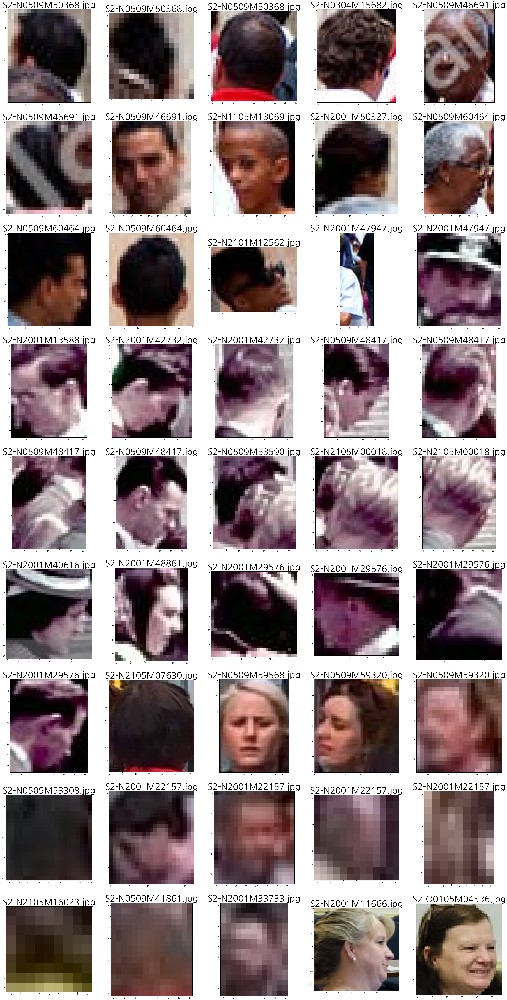

In [16]:
plt.figure(figsize=(50,100))
for num in range(45):
    plt.subplot(9,5,num+1)
    plt.title(result['2name'][num],fontdict = {'fontsize' : 50})
    plt.imshow(result[2][num + alpha])

# 1 2 3 4 5 10 11 12 13 14  16 18 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 40 41 42 43 44

In [17]:
# strange_idx = '1 2 3 4 5 10 11 12 13 14 16 18 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 40 41 42 43 44'.split(' ')

# strange_idx = [int(i) for i in strange_idx]

In [17]:
alpha = 360

In [18]:

strange_idx = list(range(45))
dirnames = []
for i in strange_idx:
    for j in images:
        if os.path.basename(j) == result['2name'][i+alpha]:
            print(j)
            dirnames.append(j)
            continue
dirnames = [os.path.dirname(i).split('/')[-1] for i in dirnames]

../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10/S2-N0509M50447.jpg
../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10/S2-N0509M41811.jpg
../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10/S2-N0509M48617.jpg
../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10/S2-N0509M48617.jpg
../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10/S2-N0509M48617.jpg
../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10/S2-N0509M55454.jpg
../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10/S2-N0509M52922.jpg
../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10/S2-N0509M57080.jpg
../../datasets/aihub_safety/train/[원천]6.상업시설_송도동2/S2-N2001M49611.jpg
../../datasets/aihub_safety/train/[원천]6.상업시설_송도동2/S2-N2001M49611.jpg
../../datasets/aihub_safety/train/[원천]10.주차장_고양스타필드7/S2-N2105M35491.jpg
../../datasets/aihub_safety/train/[원천]6.상업시설_송도동2/S2-N2001M538

In [19]:
dirnames

['[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]6.상업시설_송도동2',
 '[원천]6.상업시설_송도동2',
 '[원천]10.주차장_고양스타필드7',
 '[원천]6.상업시설_송도동2',
 '[원천]6.상업시설_송도동2',
 '[원천]6.상업시설_송도동2',
 '[원천]6.상업시설_송도동2',
 '[원천]6.상업시설_송도동2',
 '[원천]4.공항시설_인천공항 제2여객터미널 증축공사(서측)2',
 '[원천]10.주차장_고양스타필드',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]6.상업시설_송도동2',
 '[원천]6.상업시설_송도동2',
 '[원천]6.상업시설_송도동2',
 '[원천]6.상업시설_송도동2',
 '[원천]8.오피스_문정동 KG 사옥 신축공사2',
 '[원천]3.공장_가산동 A1타워 지식산업 센터2',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]6.상업시설_송도동2',
 '[원천]6.상업시설_송도동2',
 '[원천]6.

In [20]:
df = pd.DataFrame({'region' : dirnames})
df.value_counts()

region                               
[원천]6.상업시설_송도동2                          21
[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10    17
[원천]4.공항시설_인천공항 제2여객터미널 증축공사(서측)          2
[원천]10.주차장_고양스타필드                         1
[원천]10.주차장_고양스타필드7                        1
[원천]3.공장_가산동 A1타워 지식산업 센터2                1
[원천]4.공항시설_인천공항 제2여객터미널 증축공사(서측)2         1
[원천]8.오피스_문정동 KG 사옥 신축공사2                 1
dtype: int64

In [21]:
print(len(result[1]))
print(len(result[2]))


11068
12745


In [22]:
nb_data = len(result[1]) + len(result[2])

In [23]:
cls = np.ones(nb_data)
cls[11068:] = 0

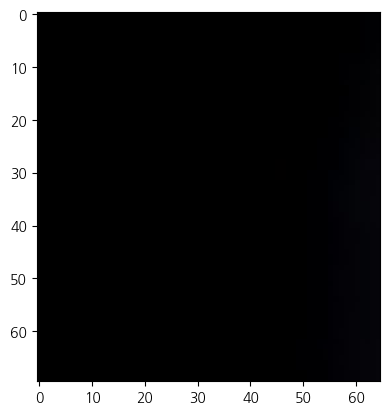

In [36]:
plt.imshow(result[1][3826])

In [126]:
width = []
height = []
w_perh = []
resolution = []
v = []
rmg = []
rmb = []
gmb = []

count_one = 11068
count = 0
for i in range(nb_data):
    if i < count_one:
        img = result[1][i] 
        width.append(result[1][i].shape[1])
        height.append(result[1][i].shape[0])
        w_perh.append(width[i]/height[i])
        resolution.append(result[1][i].shape[1] * result[1][i].shape[0])

        head = img[math.floor(result[1][i].shape[0]*2/10 ):math.ceil(result[1][i].shape[0]*4/10)+1 ,math.floor(result[1][i].shape[1] * 4/10 ):math.ceil(result[1][i].shape[1]* 6/10)+1 ,:]
        if head.mean() == 0:
            v.append(0)
            rmg.append(0)         
            rmb.append(0)         
            gmb.append(0)        
            continue
        
        v.append(head.mean())
        
        head = head * 100 / head.mean()
        
        rmg.append(head[:,:,0].mean() - head[:,:,1].mean())
        rmb.append(head[:,:,0].mean() - head[:,:,2].mean())
        gmb.append(head[:,:,1].mean() - head[:,:,2].mean())

    else:
        count +=1
        i -= count_one
        img = result[2][i] 
        width.append(result[2][i].shape[1])
        height.append(result[2][i].shape[0])
        w_perh.append(width[i]/height[i])
        resolution.append(result[2][i].shape[1] * result[2][i].shape[0])
        
        head = img[math.floor(result[2][i].shape[0]*2/10 ):math.ceil(result[2][i].shape[0]*4/10)+1 ,math.floor(result[2][i].shape[1] * 4/10 ):math.ceil(result[2][i].shape[1]* 6/10)+1 ,:]
        
        if head.mean() == 0:
            v.append(0)
            rmg.append(0)         
            rmb.append(0)         
            gmb.append(0)        
            continue

        v.append(head.mean())

        head = head * 100 / head.mean()
        
        rmg.append(head[:,:,0].mean() - head[:,:,1].mean())
        rmb.append(head[:,:,0].mean() - head[:,:,2].mean())
        gmb.append(head[:,:,1].mean() - head[:,:,2].mean())


/tmp/ipykernel_82833/4041802887.py:52: RuntimeWarning: Mean of empty slice.
  if head.mean() == 0:
/home/tekim/haha/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_82833/4041802887.py:59: RuntimeWarning: Mean of empty slice.
  v.append(head.mean())
/tmp/ipykernel_82833/4041802887.py:61: RuntimeWarning: Mean of empty slice.
  head = head * 100 / head.mean()
/tmp/ipykernel_82833/4041802887.py:64: RuntimeWarning: Mean of empty slice.
  rmg.append(head[:,:,0].mean() - head[:,:,1].mean())
/tmp/ipykernel_82833/4041802887.py:65: RuntimeWarning: Mean of empty slice.
  rmb.append(head[:,:,0].mean() - head[:,:,2].mean())
/tmp/ipykernel_82833/4041802887.py:66: RuntimeWarning: Mean of empty slice.
  gmb.append(head[:,:,1].mean() - head[:,:,2].mean())


In [24]:
print(len(w_perh))

NameError: name 'w_perh' is not defined

In [128]:
df = pd.DataFrame({'cls' : list(cls),'resulution' : resolution , 'width' : width, 'height' : height , 'ratio' : w_perh , 'v' : v , 'rmg' : rmg , 'rmb' : rmb , 'gmb' : gmb})

In [129]:
df.isnull().sum(1)[df.isnull().sum(1) >=1]


12291    4
12293    4
14202    4
14732    4
16881    4
17099    4
17266    4
18254    4
19019    4
21864    4
21964    4
22292    4
23112    4
dtype: int64

In [130]:
df.dropna(axis=0,inplace=True)

In [131]:
df

,cls,resulution,width,height,ratio,v,rmg,rmb,gmb
0,1.0,18161,127,143,0.888112,251.525730,-0.004910,-0.003060,0.001850
1,1.0,13716,108,127,0.850394,254.449275,-0.021289,-0.017011,0.004278
2,1.0,31520,197,160,1.231250,95.630592,-0.007152,-0.004466,0.002686
3,1.0,42594,229,186,1.231183,88.256232,-0.217703,-0.156813,0.060890
4,1.0,3136,49,64,0.765625,3.005556,6.632163,-23.401109,-30.033272
...,...,...,...,...,...,...,...,...,...
23808,0.0,42,6,7,0.739130,148.925926,-0.077593,-0.038796,0.038796
23809,0.0,630,15,42,0.944444,175.575000,-0.059804,-0.108216,-0.048412
23810,0.0,99,9,11,1.000000,85.000000,0.323529,0.082353,-0.241176
23811,0.0,1326,34,39,0.920000,116.833333,0.055920,0.122111,0.066191


In [132]:
df.reset_index(drop=True,inplace=True)

In [133]:
df

,cls,resulution,width,height,ratio,v,rmg,rmb,gmb
0,1.0,18161,127,143,0.888112,251.525730,-0.004910,-0.003060,0.001850
1,1.0,13716,108,127,0.850394,254.449275,-0.021289,-0.017011,0.004278
2,1.0,31520,197,160,1.231250,95.630592,-0.007152,-0.004466,0.002686
3,1.0,42594,229,186,1.231183,88.256232,-0.217703,-0.156813,0.060890
4,1.0,3136,49,64,0.765625,3.005556,6.632163,-23.401109,-30.033272
...,...,...,...,...,...,...,...,...,...
23795,0.0,42,6,7,0.739130,148.925926,-0.077593,-0.038796,0.038796
23796,0.0,630,15,42,0.944444,175.575000,-0.059804,-0.108216,-0.048412
23797,0.0,99,9,11,1.000000,85.000000,0.323529,0.082353,-0.241176
23798,0.0,1326,34,39,0.920000,116.833333,0.055920,0.122111,0.066191


In [134]:
df.isnull().sum(1)[df.isnull().sum(1) >=1]


Series([], dtype: int64)

In [135]:
df

,cls,resulution,width,height,ratio,v,rmg,rmb,gmb
0,1.0,18161,127,143,0.888112,251.525730,-0.004910,-0.003060,0.001850
1,1.0,13716,108,127,0.850394,254.449275,-0.021289,-0.017011,0.004278
2,1.0,31520,197,160,1.231250,95.630592,-0.007152,-0.004466,0.002686
3,1.0,42594,229,186,1.231183,88.256232,-0.217703,-0.156813,0.060890
4,1.0,3136,49,64,0.765625,3.005556,6.632163,-23.401109,-30.033272
...,...,...,...,...,...,...,...,...,...
23795,0.0,42,6,7,0.739130,148.925926,-0.077593,-0.038796,0.038796
23796,0.0,630,15,42,0.944444,175.575000,-0.059804,-0.108216,-0.048412
23797,0.0,99,9,11,1.000000,85.000000,0.323529,0.082353,-0.241176
23798,0.0,1326,34,39,0.920000,116.833333,0.055920,0.122111,0.066191


In [136]:
import matplotlib.pyplot as plt

In [137]:
df.loc[(abs(df.rmg) > 20) & (abs(df.rmg) < 30),:]



,cls,resulution,width,height,ratio,v,rmg,rmb,gmb
733,1.0,3366,51,66,0.772727,4.433333,28.401003,21.473684,-6.927318
1911,1.0,3752,56,67,0.835821,0.606838,21.971831,-99.447887,-121.419718
1912,1.0,4148,61,68,0.897059,1.074405,24.315789,26.842105,2.526316
9207,1.0,13056,96,136,0.705882,1.903120,-20.044866,-58.343399,-38.298533
11123,0.0,5005,91,55,0.851351,3.134722,-22.006203,-30.523704,-8.517501
11137,0.0,5376,64,84,0.835227,0.550877,23.286624,0.331210,-22.955414
11243,0.0,6080,80,76,0.835443,0.071511,-24.193548,-116.129032,-91.935484
11244,0.0,2193,51,43,1.021277,3.136364,23.642512,24.570048,0.927536
11252,0.0,7644,78,98,0.808824,0.989305,23.243243,-103.567568,-126.810811
11281,0.0,2142,42,51,0.827160,0.219697,-27.586207,-13.793103,13.793103


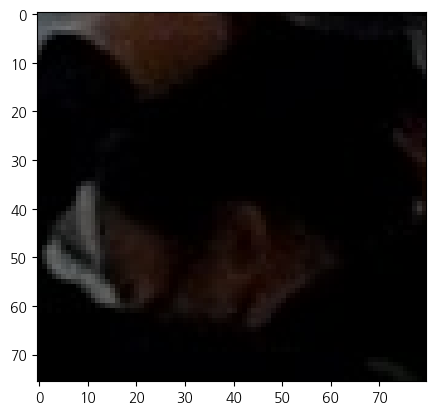

In [138]:
plt.imshow(result[2][11243-count_one])

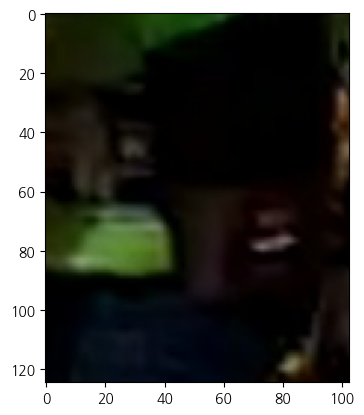

In [139]:

plt.imshow(result[1][4198])


In [140]:
result['1name'][5765]

'S2-N1106M15311.jpg'

/home/tekim/haha/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


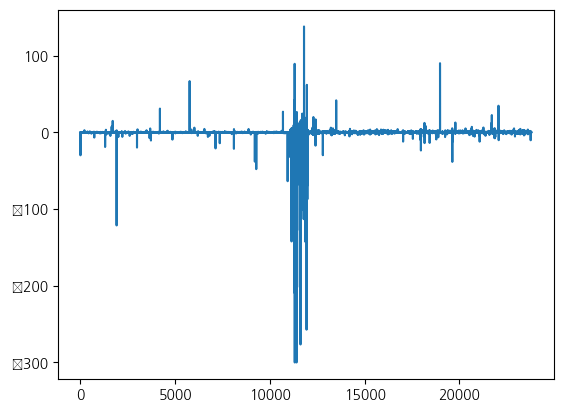

In [141]:
plt.plot(df.gmb)

In [142]:
df.ratio[(df.ratio < 2.5) * (df.ratio > 1.5) ].keys()

Int64Index([   10,   284,   392,   580,   601,   617,   929,  1314,  1964,
             2068,
            ...
            22611, 22637, 22747, 22776, 22874, 22877, 22944, 22950, 22984,
            23041],
           dtype='int64', length=143)

In [143]:
df.ratio[(df.ratio < 2.5) * (df.ratio > 1.5) ].keys().shape

(143,)

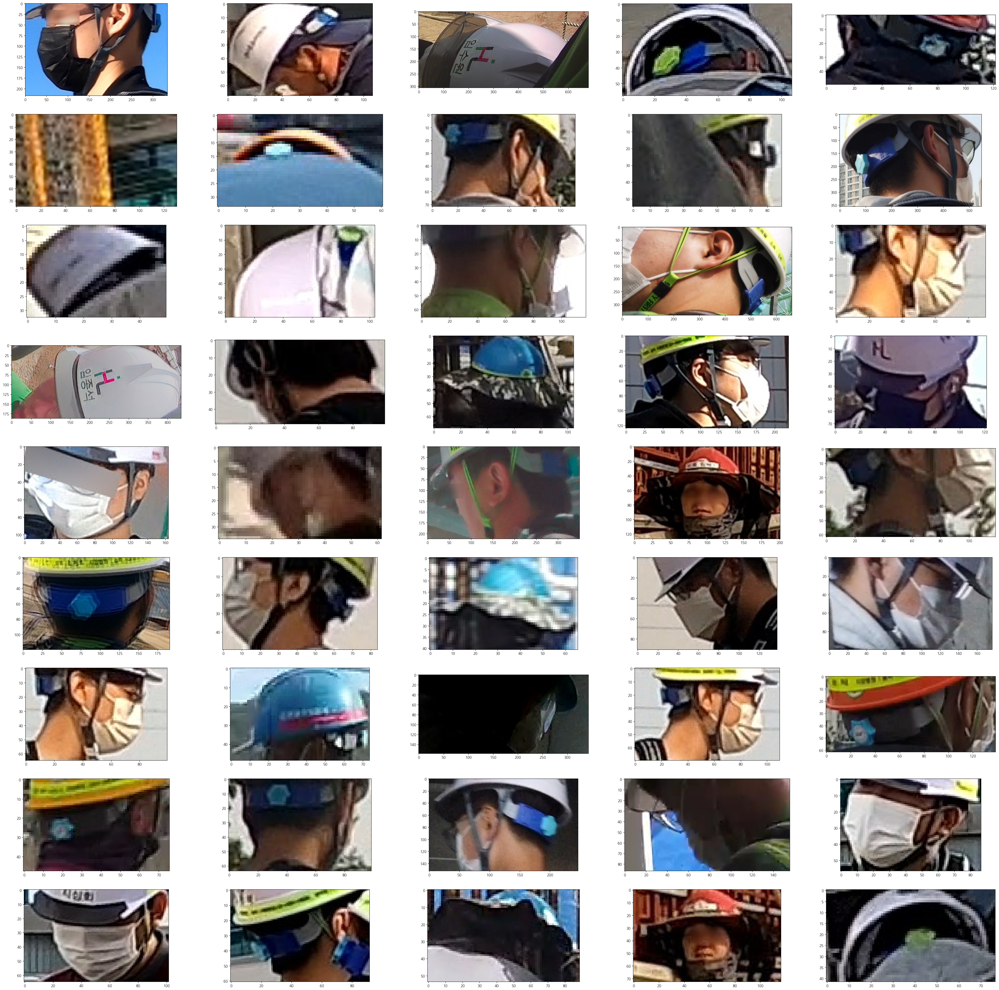

In [144]:
plt.figure(figsize=(50,50))
for i,num in enumerate(df.ratio[(df.ratio < 2.5) * (df.ratio > 1.5) ].keys()):
    if(i >= 45):
        break
    plt.subplot(9,5,i+1)
    if (num < count_one):
        plt.imshow(result[1][num])
    else:
        plt.imshow(result[2][num- count_one])


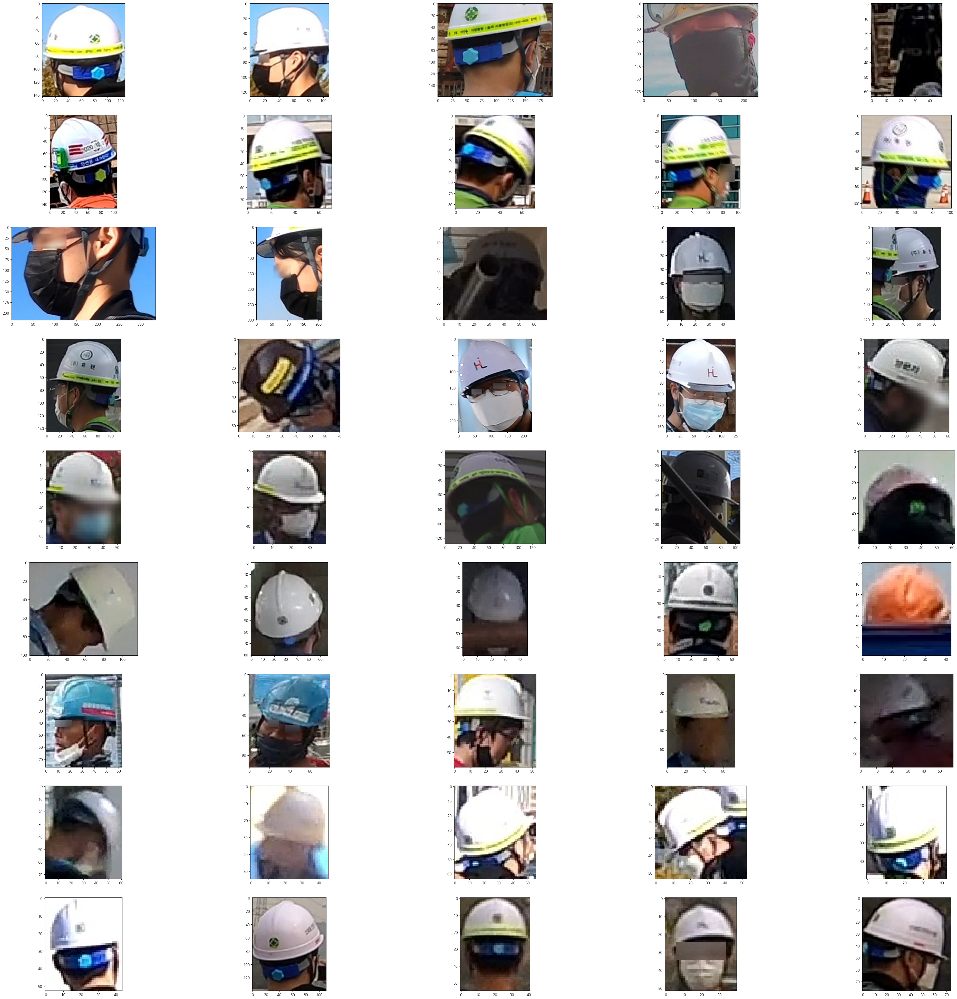

In [68]:
plt.figure(figsize=(50,50))
for num in range(45):
    
    plt.subplot(9,5,num+1)
    plt.imshow(result[1][num])

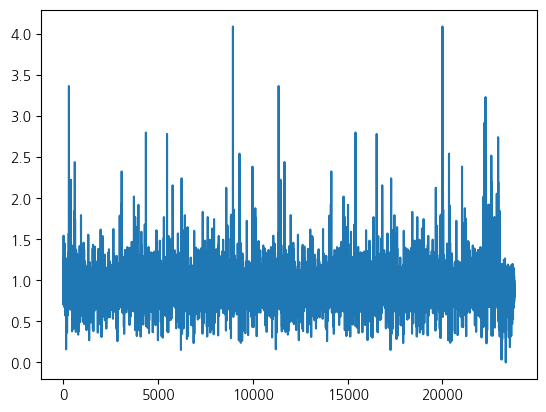

In [69]:
plt.plot(df.ratio)

In [145]:
import xgboost
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import explained_variance_score

In [146]:
model = xgboost.XGBClassifier()

In [147]:
X_train = df.iloc[:,1:]
y_train = df.iloc[:,0]


In [118]:
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train ,test_size=0.2, stratify=y_train)

ValueError: The least populated class in y has only 1 member, which is too few. The minimum number of groups for any class cannot be less than 2.

In [148]:
model.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [111]:
model.fit(X_test,y_test)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [103]:
len(y_train)

19040

In [149]:
model.score(X_train, y_train)

0.961890756302521

In [150]:
model.score(X_test, y_test)

0.9615546218487395

In [151]:
img1 = cv2.imread('../../datasets/xgboost_images/image1.jpg')[...,::-1]
img2 = cv2.imread('../../datasets/xgboost_images/image2.jpg')[...,::-1]
img3 = cv2.imread('../../datasets/xgboost_images/image3.jpg')[...,::-1]

imgs = [img1,img2,img3]


In [152]:
width = []
height = []
w_perh = []
resolution = []
v = []
rmg = []
rmb = []
gmb = []

for i in range(len(imgs)):
    width.append(imgs[i].shape[1])
    height.append(imgs[i].shape[0])
    w_perh.append(width[i]/height[i])
    resolution.append(imgs[i].shape[1] * imgs[i].shape[0])


    head = img[math.floor(imgs[i].shape[0]*2/10 ):math.ceil(imgs[i].shape[0]*4/10)+1 ,math.floor(imgs[i].shape[1] * 4/10 ):math.ceil(imgs[i].shape[1]* 6/10)+1 ,:]

    v.append(head.mean())

    if head.mean() == 0:
        rmg.append(0)         
        rmb.append(0)         
        gmb.append(0)        
        continue
    
    head = head * 100 / head.mean()

    rmg.append(head[:,:,0].mean() - head[:,:,1].mean())
    rmb.append(head[:,:,0].mean() - head[:,:,2].mean())
    gmb.append(head[:,:,1].mean() - head[:,:,2].mean())

    # jaw = img[(height//10 *6):(height//10*8) ,(width//10 *4):(width//10*6) ,:]
    # jaw = jaw * 100 // torch.mean(jaw)




/tmp/ipykernel_82833/369502310.py:19: RuntimeWarning: Mean of empty slice.
  v.append(head.mean())
/home/tekim/haha/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_82833/369502310.py:21: RuntimeWarning: Mean of empty slice.
  if head.mean() == 0:
/tmp/ipykernel_82833/369502310.py:27: RuntimeWarning: Mean of empty slice.
  head = head * 100 / head.mean()
/tmp/ipykernel_82833/369502310.py:29: RuntimeWarning: Mean of empty slice.
  rmg.append(head[:,:,0].mean() - head[:,:,1].mean())
/tmp/ipykernel_82833/369502310.py:30: RuntimeWarning: Mean of empty slice.
  rmb.append(head[:,:,0].mean() - head[:,:,2].mean())
/tmp/ipykernel_82833/369502310.py:31: RuntimeWarning: Mean of empty slice.
  gmb.append(head[:,:,1].mean() - head[:,:,2].mean())


In [153]:
df = pd.DataFrame({'resulution' : resolution , 'width' : width, 'height' : height , 'ratio' : w_perh , 'v' : v , 'rmg' : rmg , 'rmb' : rmb , 'gmb' : gmb})

In [154]:
model.predict(df)

array([0, 0, 0])